In [1]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import cv2

In [2]:
def show_image(img, title = None):
    plt.imshow(img)
    plt.title(title);

In [3]:
img = cv2.imread('image.png')

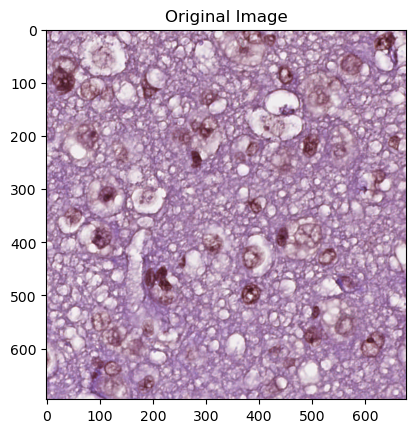

In [4]:
show_image(img, 'Original Image')

In [5]:
result = cv2.imread('image_gt.png')

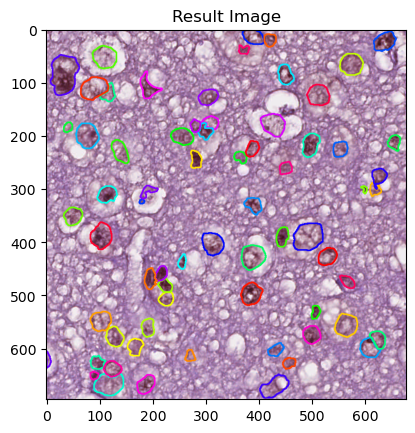

In [6]:
show_image(result, 'Result Image')

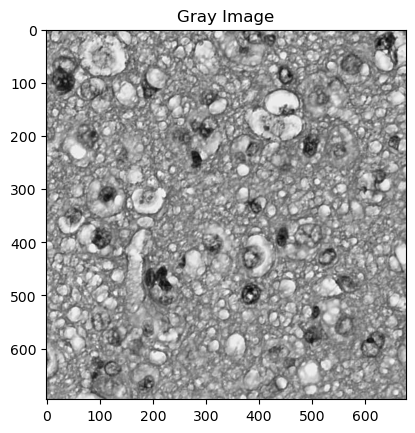

In [7]:
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
plt.imshow(gray, cmap = 'gray')
plt.title('Gray Image');

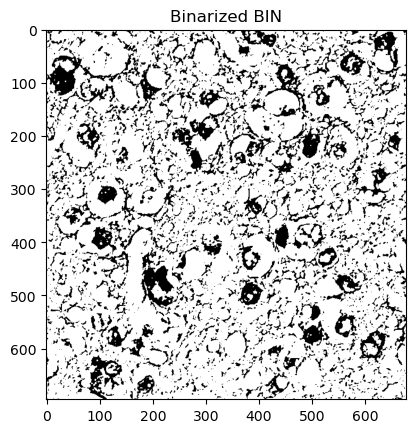

In [8]:
_,  bin_img = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY) 
plt.imshow(bin_img, cmap = 'gray')
plt.title('Binarized BIN');

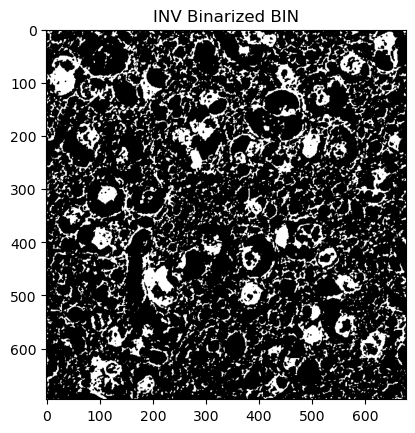

In [9]:
_,  bin_inv_img = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY_INV) 
plt.imshow(bin_inv_img, cmap = 'gray')
plt.title('INV Binarized BIN');

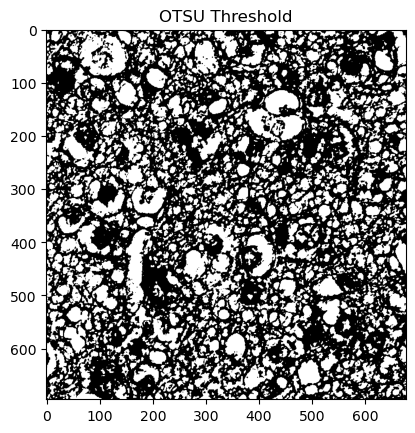

In [10]:
_,  bin_img_otsu = cv2.threshold(gray, 127, 255, cv2.THRESH_OTSU) 
plt.imshow(bin_img_otsu, cmap = 'gray')
plt.title('OTSU Threshold');

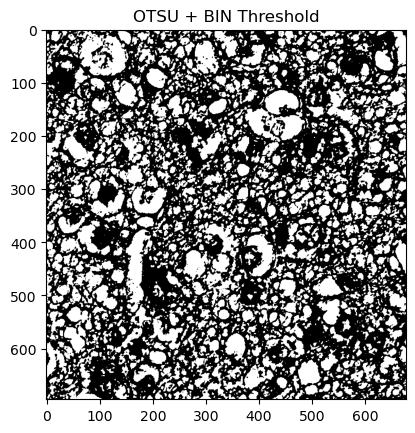

In [11]:
_,  bin_img_otsu_bin = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU) 
plt.imshow(bin_img_otsu_bin, cmap = 'gray')
plt.title('OTSU + BIN Threshold');

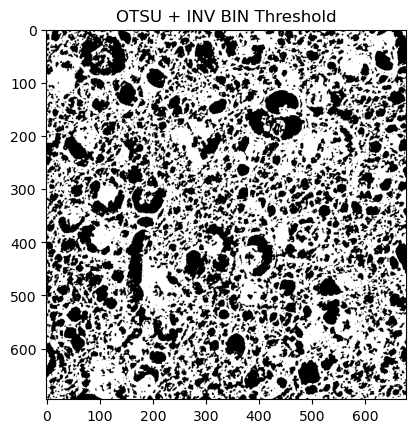

In [12]:
_,  bin_inv_img_otsu_bin = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU) 
plt.imshow(bin_inv_img_otsu_bin, cmap = 'gray')
plt.title('OTSU + INV BIN Threshold');

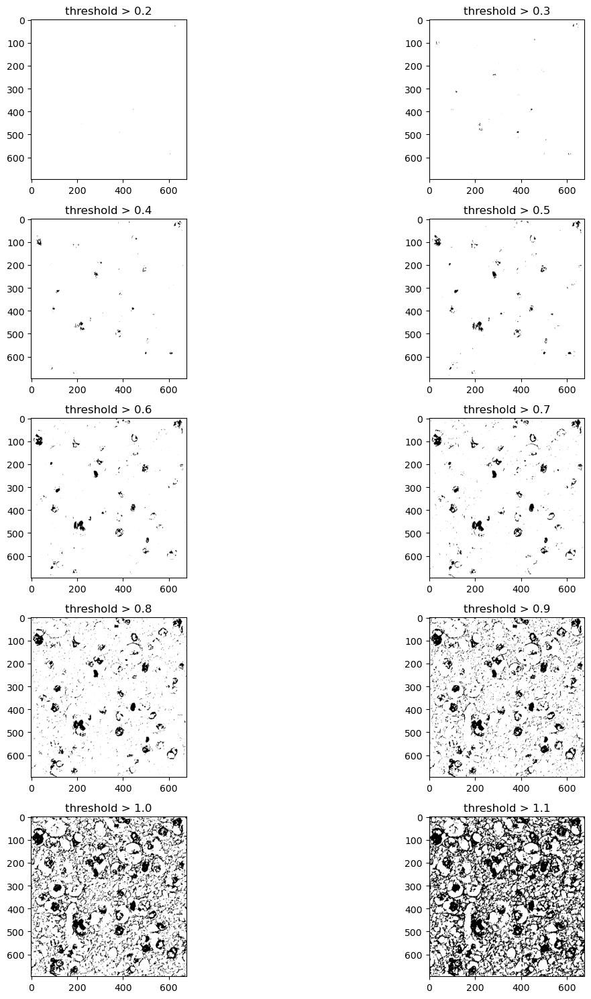

In [13]:
plt.figure(figsize=(15, 15))
 
for i in range(2,12):
    
    binarized_gray = (gray > i*13)*1
    plt.subplot(5,2,i-1)
    
    plt.title("threshold > "+str(round(i*0.1,1)))
    plt.imshow(binarized_gray, cmap = 'gray')
    
plt.tight_layout()

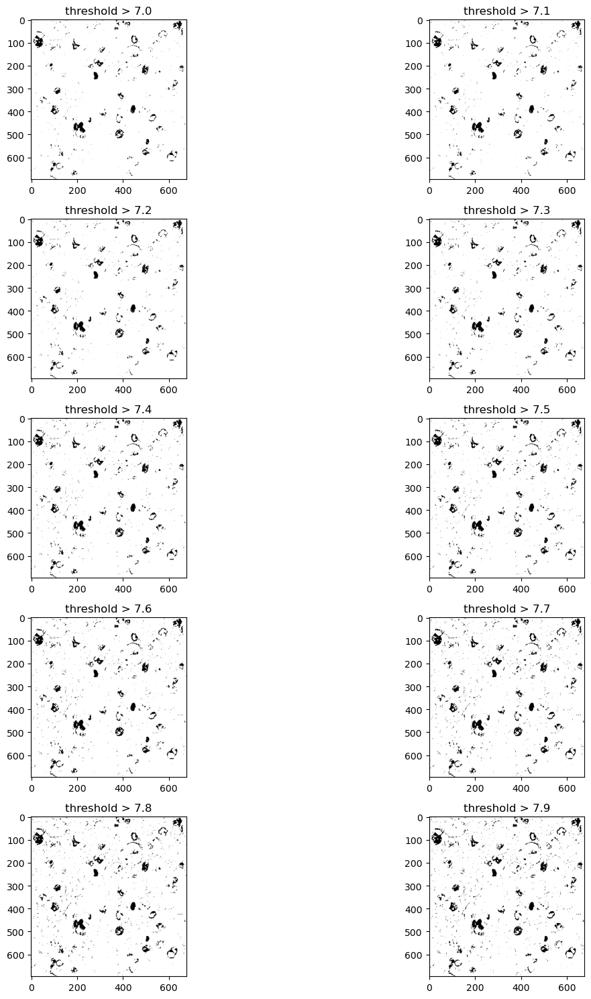

In [14]:
plt.figure(figsize=(15, 15))
 
for i in range(70,80):
    
    binarized_gray = (gray > i*1.3)*1
    plt.subplot(5,2,i-69)
    
    plt.title("threshold > "+str(round(i*0.1,1)))
    plt.imshow(binarized_gray, cmap = 'gray')
    
plt.tight_layout()

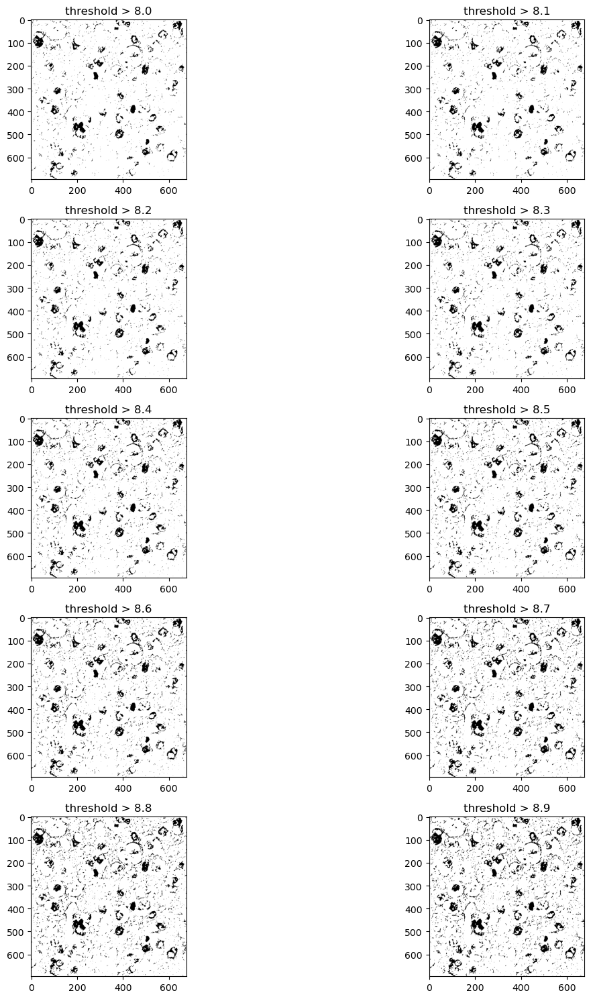

In [15]:
plt.figure(figsize=(15, 15))
 
for i in range(80,90):
    
    binarized_gray = (gray > i*1.3)*1
    plt.subplot(5,2,i-79)
    
    plt.title("threshold > "+str(round(i*0.1,1)))
    plt.imshow(binarized_gray, cmap = 'gray')
    
plt.tight_layout()

In [16]:
from skimage import data
from skimage import filters
from skimage.color import rgb2gray
import matplotlib.pyplot as plt
from skimage.filters import gaussian
from skimage.segmentation import active_contour

In [17]:
threshold = filters.threshold_otsu(gray)

In [18]:
binarized = (gray > threshold)*1

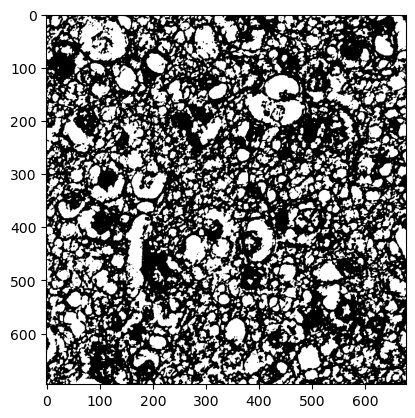

In [19]:
plt.imshow(binarized, cmap = 'gray')

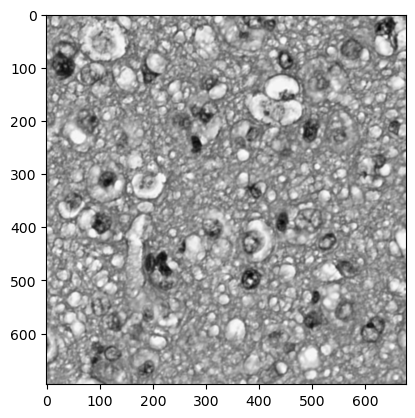

In [20]:
gray_nuclei = gaussian(gray, 1)
plt.imshow(gray_nuclei, cmap = 'gray');

In [21]:
from skimage.segmentation import chan_vese
chanvese_gray_nuclei = chan_vese(gray,max_num_iter = 100,
                                    extended_output=True)

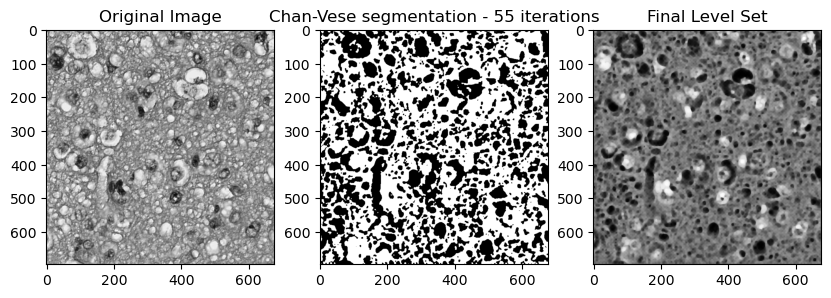

In [22]:
fig, axes = plt.subplots(1, 3, figsize=(10, 10))
ax = axes.flatten()
 
# Plotting the original image
ax[0].imshow(gray, cmap="gray")
ax[0].set_title("Original Image")
 
# Plotting the segmented - 100 iterations image
ax[1].imshow(chanvese_gray_nuclei[0], cmap="gray")
title = "Chan-Vese segmentation - {} iterations".format(len(chanvese_gray_nuclei[2]))
 
ax[1].set_title(title)
 
# Plotting the final level set
ax[2].imshow(chanvese_gray_nuclei[1], cmap="gray")
ax[2].set_title("Final Level Set")
plt.show()

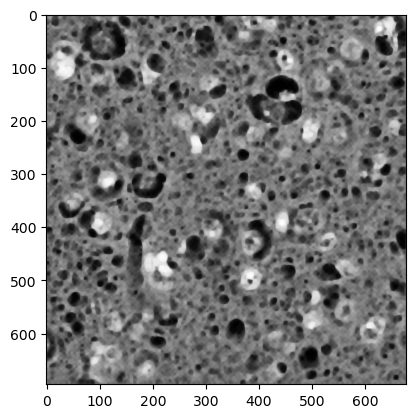

In [23]:
plt.imshow(chanvese_gray_nuclei[1], cmap="gray");

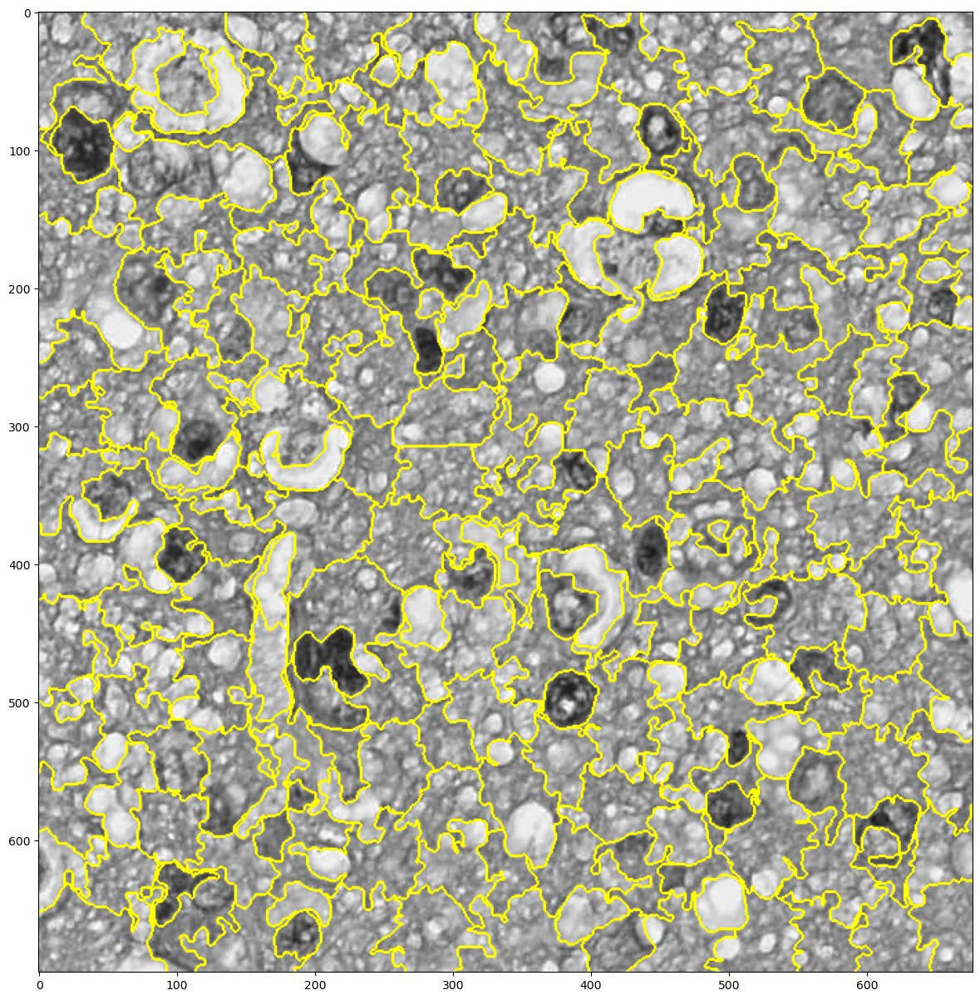

In [24]:
from skimage.segmentation import slic, mark_boundaries
plt.figure(figsize=(15, 15))

nuclei_segments = slic(chanvese_gray_nuclei[1], n_segments = 300, compactness = 0.1,channel_axis = None )
plt.imshow(mark_boundaries(gray, nuclei_segments));

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


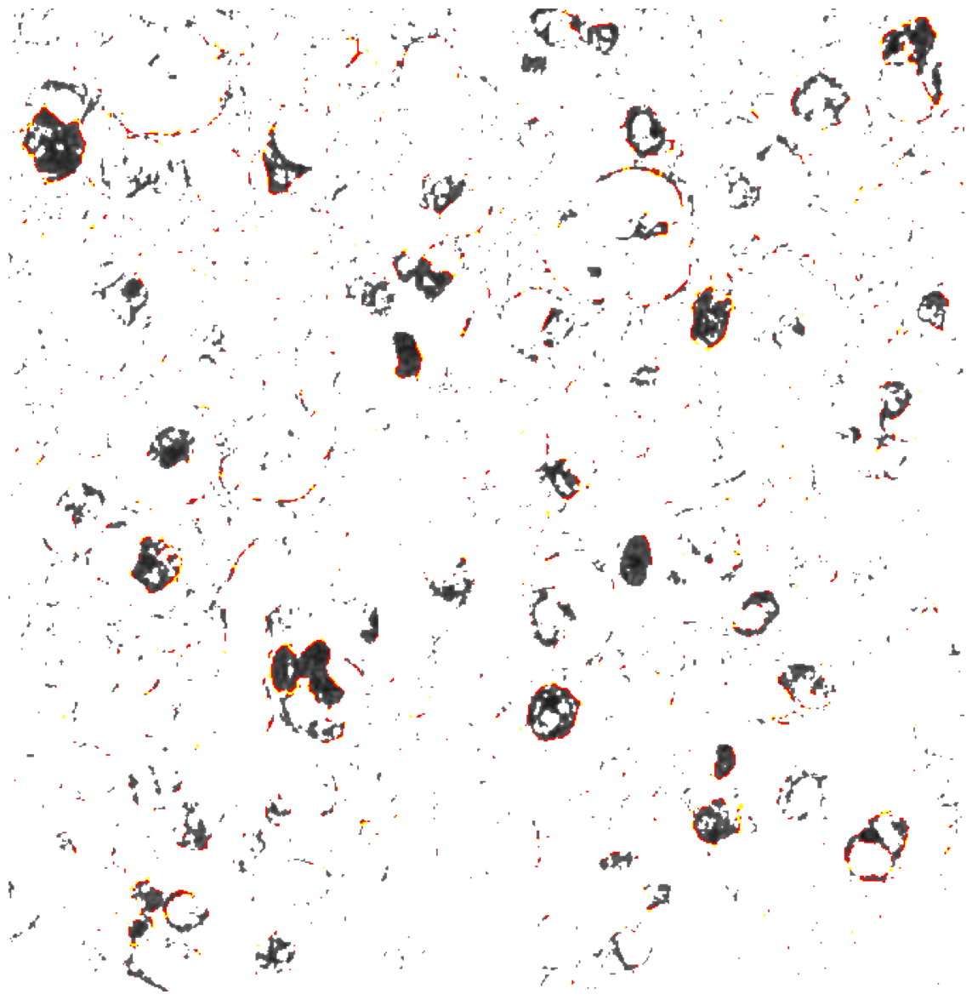

In [25]:
dark_components = np.where(gray > 104, 1, 0)
highlighted_image = mark_boundaries(gray, nuclei_segments, 
                                    color=(1, 1, 0), 
                                    outline_color=(1, 0, 0)) + dark_components[:, :, np.newaxis]

# Plot the result
plt.figure(figsize=(15, 15))
plt.imshow(highlighted_image)
plt.axis('off')
plt.show()

In [50]:
dark_components

array([[1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       ...,
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1]])

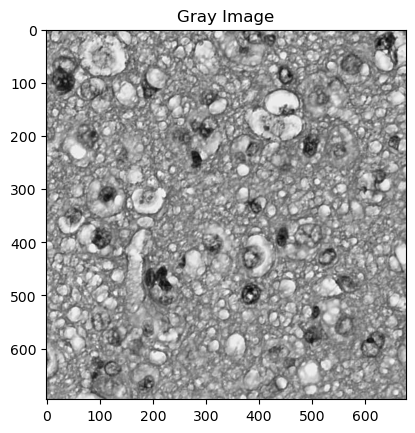

In [26]:
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
plt.imshow(gray, cmap = 'gray')
plt.title('Gray Image');

In [27]:
gray.shape

(696, 677)

In [28]:
new_gray = gray.copy()

for i in range(gray.shape[0]):
    for j in range(gray.shape[1]):
        if gray[i][j] < 30:
            new_gray[i][j] = max(0, new_gray[i][j]+60)


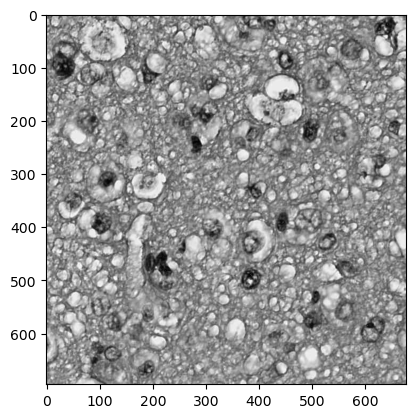

In [29]:
plt.imshow(new_gray, cmap = 'gray');

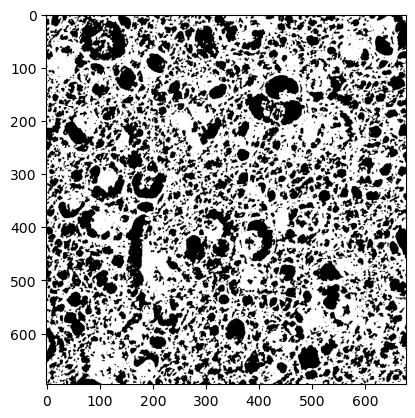

In [30]:
ret, binary = cv2.threshold(new_gray, 100, 255, 
  cv2.THRESH_OTSU + cv2.THRESH_BINARY_INV)
plt.imshow(binary, cmap = 'gray');

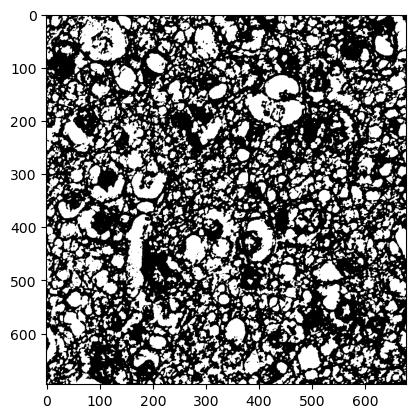

In [31]:
inverted_binary = ~binary
plt.imshow(inverted_binary, 'gray');

In [32]:
import cv2
import numpy as np
from IPython.display import Image, display
from matplotlib import pyplot as plt

def imshow(img, ax=None):
    if ax is None:
        ret, encoded = cv2.imencode(".jpg", img)
        display(Image(encoded))
    else:
        ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax.axis('off')

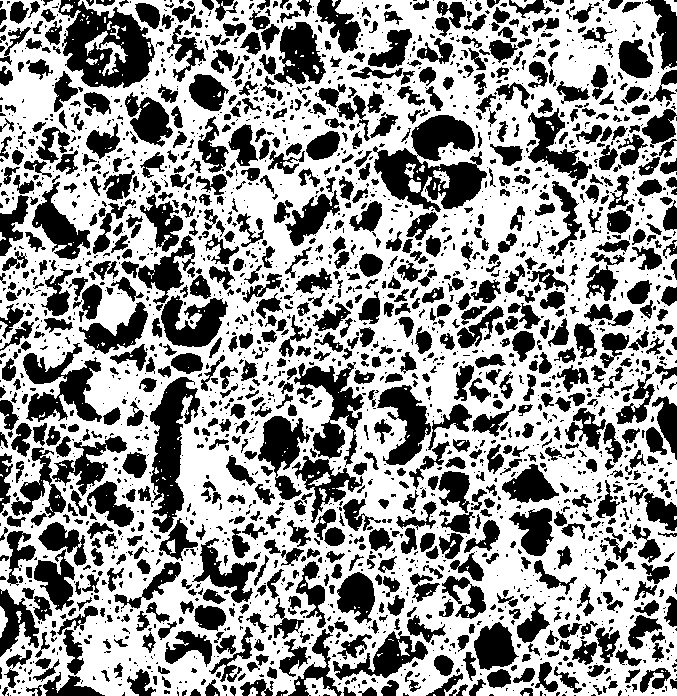

In [33]:
ret, bin_img = cv2.threshold(new_gray,
                             0, 255, 
                             cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
imshow(bin_img)

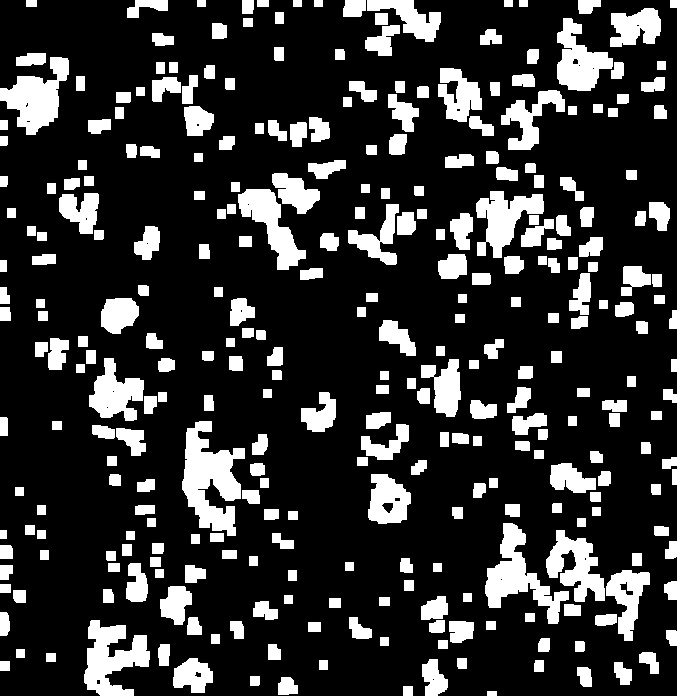

In [46]:
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5, 5))
bin_img = cv2.morphologyEx(bin_img, 
                           cv2.MORPH_OPEN,
                           kernel,
                           iterations=2)
imshow(bin_img)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


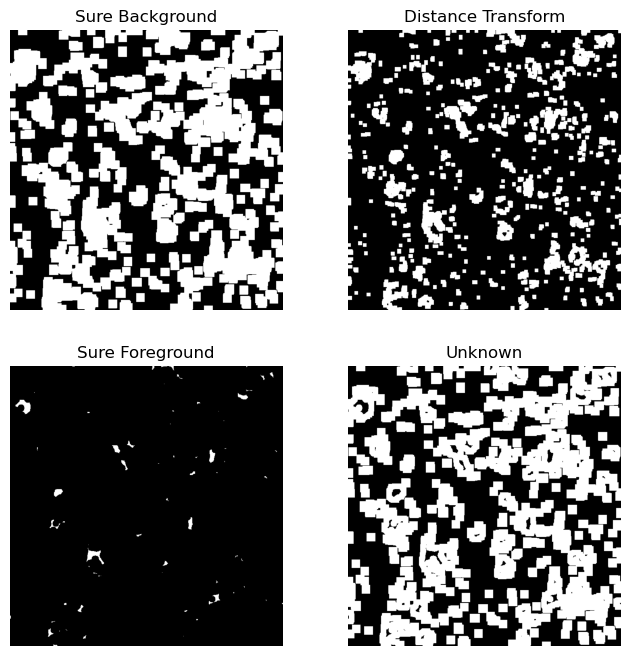

In [47]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(8, 8))
# sure background area
sure_bg = cv2.dilate(bin_img, kernel, iterations=3)
imshow(sure_bg, axes[0,0])
axes[0, 0].set_title('Sure Background')
 
# Distance transform
dist = cv2.distanceTransform(bin_img, cv2.DIST_L2, 5)
imshow(dist, axes[0,1])
axes[0, 1].set_title('Distance Transform')
 
#foreground area
ret, sure_fg = cv2.threshold(dist, 0.5 * dist.max(), 255, cv2.THRESH_BINARY)
sure_fg = sure_fg.astype(np.uint8)  
imshow(sure_fg, axes[1,0])
axes[1, 0].set_title('Sure Foreground')
 
# unknown area
unknown = cv2.subtract(sure_bg, sure_fg)
imshow(unknown, axes[1,1])
axes[1, 1].set_title('Unknown')
 
plt.show()

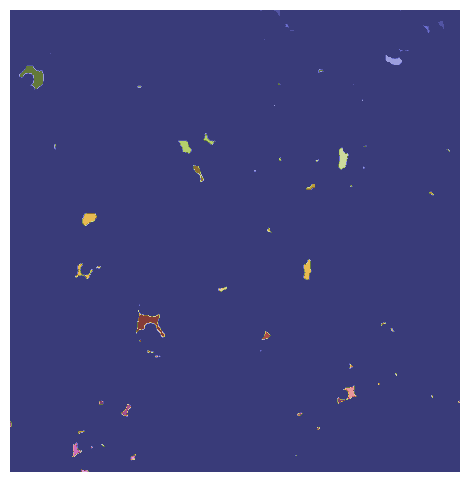

In [48]:
ret, markers = cv2.connectedComponents(sure_fg)
 
# Add one to all labels so that background is not 0, but 1
markers += 1
# mark the region of unknown with zero
markers[unknown == 255] = 0
 
fig, ax = plt.subplots(figsize=(6, 6))
ax.imshow(markers, cmap="tab20b")
ax.axis('off')
plt.show()

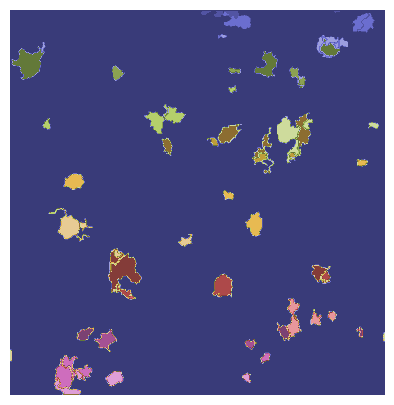

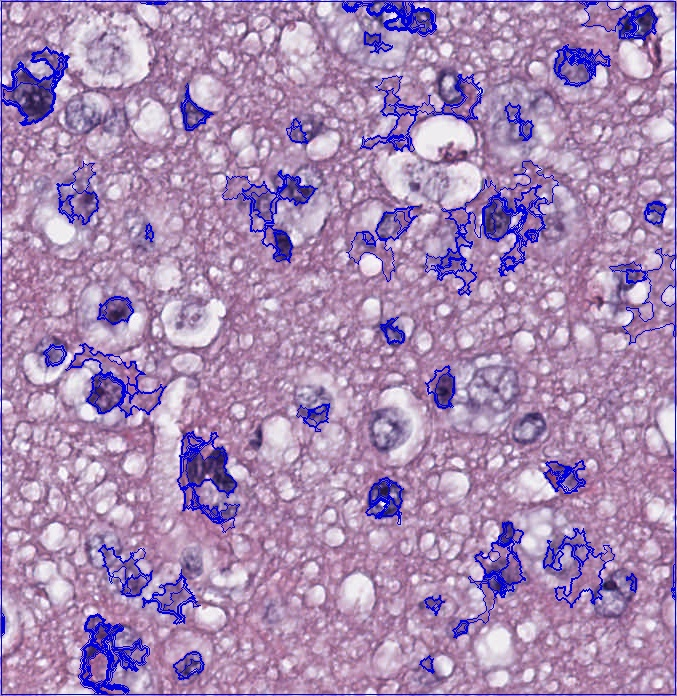

In [49]:
markers = cv2.watershed(img, markers,)
 
fig, ax = plt.subplots(figsize=(5, 5))
ax.imshow(markers, cmap="tab20b")
ax.axis('off')
plt.show()
 
 
labels = np.unique(markers)
 
coins = []
for label in labels[2:]:  
 
#and the rest of the image is in the background   
    target = np.where(markers == label, 255, 0).astype(np.uint8)
   
  # Perform contour extraction on the created binary image
    contours, hierarchy = cv2.findContours(
        target, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE
    )
    coins.append(contours[0])
 
# Draw the outline
img = cv2.drawContours(img, coins, -1, color=(223, 0, 0), thickness=1)
imshow(img)